## Imports - librairies


In [2]:
try:
    import ultralytics
    from ultralytics import YOLO

    ultralytics.checks()
except:

    !pip install ultralytics
    !pip install onnx
    import ultralytics
    from ultralytics import YOLO

from IPython import display

display.clear_output()

In [3]:

import seaborn as sns  # library for visualization

sns.set_style("darkgrid")
import matplotlib.pyplot as plt  # library for visualization
%matplotlib inline
import pandas as pd

try:
    import dataframe_image as dfi
except:
    !pip install dataframe_image
    import dataframe_image as dfi
from tqdm import tqdm

tqdm.pandas()
import os
from glob import glob
import random
from datetime import datetime
import numpy as np
from typing import List, Tuple, Dict, Union
from sklearn.metrics import ConfusionMatrixDisplay

import re
import cv2
from PIL import Image
import yaml
import requests
import json

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.7/6.7 MB 14.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 398.5/398.5 kB 29.8 MB/s eta 0:00:00


## Set up Google Drive

In [4]:
SET_UP_GOOGLE_DRIVE = True


if SET_UP_GOOGLE_DRIVE:
    # set up the drive
    from google.colab import drive

    drive.mount('/content/gdrive')
    KESKIA_DRIVE_ROOT_PATH = r"/content/gdrive/MyDrive/KESKIA Drive Mlamali"

    # get categories (classes dict)
    from getpass import getpass

    access_token = getpass('Enter your GitHub Personal Access Token: ')

    url = 'https://raw.githubusercontent.com/Mlamalerie/Mantes-Plus-Propre/dev/src/detection/category_utils.py'
    headers = {'Authorization': f'token {access_token}'}
    response = requests.get(url, headers=headers)

    if response.status_code == 200:
        with open('category_utils.py', 'w') as file:
            file.write(response.text)
    else:
        print("Failed to fetch the file. Status code:", response.status_code)

    from category_utils import CATIDX_2_FR_CATNAME, CATIDX_2_FR_SUPERCATNAME
else:
    KESKIA_DRIVE_ROOT_PATH = r"N:/My Drive/KESKIA Drive Mlamali"
    from src.detection.category_utils import CATIDX_2_FR_CATNAME, CATIDX_2_FR_SUPERCATNAME


Mounted at /content/gdrive
Enter your GitHub Personal Access Token: ··········


## Dataset

In [5]:
DATASETS_DIR_ROOT_PATH = f"{KESKIA_DRIVE_ROOT_PATH}/datasets/processed"
print(DATASETS_DIR_ROOT_PATH)
print("> Available: ", np.array(os.listdir(DATASETS_DIR_ROOT_PATH)))

MY_DATASET_NAME = 'fused-dataset 20240115'

MY_DATASET_PATH = os.path.join(DATASETS_DIR_ROOT_PATH, MY_DATASET_NAME)
if not os.path.exists(MY_DATASET_PATH):
    raise FileExistsError("ehhh")
print("> Choosen: ", MY_DATASET_PATH)

/content/gdrive/MyDrive/KESKIA Drive Mlamali/datasets/processed
> Available:  ['taco-dataset (yoloformat) train-3826-val-479-test-479 20231226_03' 'detection-dechets-sauvages.v3i.yolov8.zip' 'detection-dechets-sauvages.v3i.yolov8' 'fused-dataset 20240115']
> Choosen:  /content/gdrive/MyDrive/KESKIA Drive Mlamali/datasets/processed/fused-dataset 20240115


In [6]:
print(os.listdir(MY_DATASET_PATH))

['train', 'val', 'test', 'meta_df.csv', 'README.roboflow.txt', 'README.dataset.txt', 'class_distribution.png', 'data.yaml']


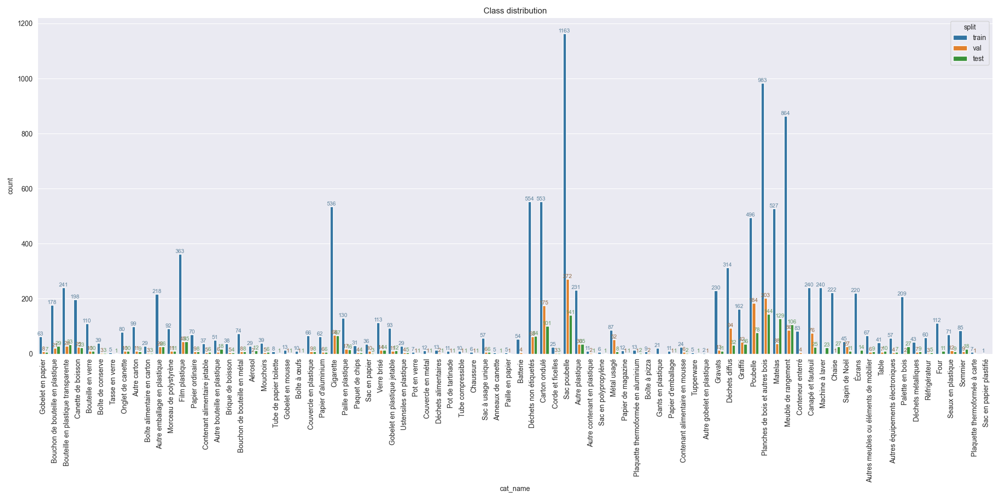

In [7]:
# display class distribution
image_path = f"{MY_DATASET_PATH}/class_distribution.png"
image = Image.open(image_path)
image


## • Model Training

### Params

In [21]:
TRAINING_MODEL: str = "yolov8s"

TRAINING_EPOCHS: int = 100
TRAINING_IMGSZ: int = 640  # wich choose
TRAINING_BATCH_SIZE: int = 16
if TRAINING_MODEL[-1] in ["s","n"]:
    TRAINING_PATIENCE: int = 15
elif TRAINING_MODEL[-1] in ["m"]:
    TRAINING_PATIENCE: int = 20
else:
    TRAINING_PATIENCE: int = 10

TRAINING_ROOT_LOGS_PATH: str = f"{KESKIA_DRIVE_ROOT_PATH}/yolo-training-logs"
TRAINING_NAME_BIS: str = f"{TRAINING_MODEL} [{MY_DATASET_NAME}, epochs={TRAINING_EPOCHS}] {datetime.now().strftime('%Y%m%d_%H%M')}"
TRAINING_NAME: str = f"train {TRAINING_NAME_BIS}"
TRAINING_DATA: str = os.path.join(MY_DATASET_PATH, "data.yaml")
TRAINING_MODEL_PATH = f"{TRAINING_MODEL}.pt"

%cat "$TRAINING_DATA"

train: ../train/images
val: ../val/images
test: ../test/images

nc: 82
names: ["Papier d'aluminium", 'Batterie', 'Plaquette thermoformée en aluminium', 'Plaquette thermoformée à carte', 'Autre bouteille en plastique', 'Bouteille en plastique transparente', 'Bouteille en verre', 'Bouchon de bouteille en plastique', 'Bouchon de bouteille en métal', 'Verre brisé', 'Boîte de conserve', 'Aérosol', 'Canette de boisson', 'Tube de papier toilette', 'Autre carton', 'Boîte à œufs', 'Brique de boisson', 'Carton ondulé', 'Boîte alimentaire en carton', 'Boîte à pizza', 'Gobelet en papier', 'Gobelet en plastique jetable', 'Gobelet en mousse', 'Tasse en verre', 'Autre gobelet en plastique', 'Déchets alimentaires', 'Pot en verre', 'Couvercle en plastique', 'Couvercle en métal', 'Autre plastique', 'Papier de magazine', 'Mouchoirs', "Papier d'emballage", 'Papier ordinaire', 'Sac en papier', 'Sac en papier plastifié', 'Film plastique', 'Anneaux de canette', 'Sac poubelle', 'Autre emballage en plastique',

### Logger

In [ ]:
LOG_DIR = f"{TRAINING_ROOT_LOGS_PATH}/{TRAINING_NAME}"
print(LOG_DIR)

%load_ext tensorboard
%tensorboard --logdir "$LOG_DIR"

Output hidden; open in https://colab.research.google.com to view.

### Launch Yolo 🔥

YOLOv8 may be used directly in the Command Line Interface (CLI) with a `yolo` command for a variety of tasks and modes and accepts additional arguments, i.e. `imgsz=640`. See a full list of available `yolo` [arguments](https://docs.ultralytics.com/usage/cfg/) and other details in the [YOLOv8 Predict Docs](https://docs.ultralytics.com/modes/train/).


In [ ]:
print(TRAINING_MODEL_PATH, " ", TRAINING_EPOCHS, " ", TRAINING_DATA)

yolov8s.pt   100   /content/gdrive/MyDrive/KESKIA Drive Mlamali/datasets/processed/fused-dataset 20240115/data.yaml


In [ ]:
!yolo task=detect mode=train model="$TRAINING_MODEL_PATH" data="$TRAINING_DATA" epochs="$TRAINING_EPOCHS" patience="$TRAINING_PATIENCE" imgsz="$TRAINING_IMGSZ" name="$TRAINING_NAME" project="$TRAINING_ROOT_LOGS_PATH" plots=True save=True

100% 21.5M/21.5M [00:00<00:00, 115MB/s]
Ultralytics YOLOv8.1.2 🚀 Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8s.pt, data=/content/gdrive/MyDrive/KESKIA Drive Mlamali/datasets/processed/fused-dataset 20240115/data.yaml, epochs=100, time=None, patience=20, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=/content/gdrive/MyDrive/KESKIA Drive Mlamali/yolo-training-logs, name=train yolov8s [fused-dataset 20240115, epochs=100] 20240118_0113, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffe

### Result of Training

#### Métriques d'Entraînement YOLO

Dans l'entraînement des modèles YOLO pour la détection d'objets, plusieurs métriques sont utilisées pour évaluer les performances et la progression de l'apprentissage.

Chaque métrique apporte des informations différentes sur les performances du modèle. Il est important de les considérer ensemble pour avoir une vue d'ensemble.

---

1. box_loss
    - **Explication :** Mesure l'erreur dans la prédiction des boîtes englobantes. Une valeur faible indique une précision dans la localisation des objets.
    - **Valeur satisfaisante :** Plus proche de zéro est mieux, valeur spécifique dépend du jeu de données.

2. cls_loss
    - **Explication :** "Class loss" est l'erreur dans la prédiction de la classe de l'objet.
    - **Valeur satisfaisante :** Plus proche de zéro est mieux, dépend de la diversité des classes.

3. dfl_loss (si applicable)
    - **Explication :** "Distribution-Focal Loss", utilisée pour améliorer la prédiction de la boîte englobante.
    - **Valeur satisfaisante :** Plus bas est mieux, valeur spécifique dépend du problème.

4. Box Precision (P)
    - **Explication :** Précision des prédictions de boîtes englobantes.
    - **Valeur satisfaisante :** Plus de 50% est généralement acceptable, 70-80% pour applications critiques.

5. Recall (R)
    - **Explication :** Capacité du modèle à détecter tous les objets pertinents.
    - **Valeur satisfaisante :** Plus de 50% est souvent acceptable, dépend de l'importance de ne pas manquer d'objets.

6. mAP@50
    - **Explication :** "Mean Average Precision at 50%", moyenne de la précision à différents seuils IoU.
    - **Valeur satisfaisante :** Plus de 50% est généralement bon, 70% ou plus pour applications exigeantes.

7. mAP@50-95
    - **Explication :** Moyenne de la précision à différents seuils IoU, de 50% à 95%.
    - **Valeur satisfaisante :** Plus de 30-40% est souvent considéré comme bon, dépend de la complexité du problème.

#### Métrique Principale pour la Performance
- **mAP@50-95** est généralement considérée comme la métrique la plus représentative de la performance globale dans la détection d'objets. Elle tient compte de la précision à différents seuils IoU.

à lire : https://jonathan-hui.medium.com/map-mean-average-precision-for-object-detection-45c121a31173


In [ ]:
os.listdir(LOG_DIR)

In [ ]:
df_results = pd.read_csv(f"{LOG_DIR}/results.csv")
df_results

In [ ]:
image_result_paths = [os.path.join(dirname, filename) for dirname, _, filenames in os.walk(LOG_DIR) for filename in
                      filenames if filename[-4:] in ['.jpg', ".png"]]

from PIL import Image
import numpy as np

print(image_result_paths)
for path in image_result_paths:
    image = Image.open(path)
    image = np.array(image)
    plt.figure(figsize=(20, 10))
    plt.imshow(image)
    plt.axis('off')
    plt.show()

### Others Backups

#### data.yaml

In [ ]:
LOG_DIR

In [ ]:
backup_data_yaml_path = f"{LOG_DIR}/{os.path.basename(TRAINING_DATA)}"

# Copier le contenu du dossier 'runs' dans le nouveau dossier de sauvegarde
#!scp -r "$LOG_DIR" "$backup_path"
!scp -r "$TRAINING_DATA" "$backup_data_yaml_path"

!echo "Sauvegarde complétée dans: $LOG_DIR"

#### Export best to ONNX

In [ ]:
best_model_path = f"{LOG_DIR}/weights/best.pt"
if not os.path.exists(best_model_path):
    raise FileExistsError("ehh")

!yolo export model="$best_model_path" format=onnx  # export custom trained model

## • Test Prediction



### Load Best Model + Get Params

In [15]:
#best_model_path = f"{LOG_DIR}/weights/best.pt"
best_model_path = f"{KESKIA_DRIVE_ROOT_PATH}/yolo-training-logs/train yolov8s [fused-dataset 20240115, epochs=100] 20240118_0113/weights/best.pt"

if not os.path.exists(best_model_path):
    raise FileExistsError("ehh")

TRAINING_ROOT_LOGS_PATH = os.path.dirname(os.path.dirname(os.path.dirname(best_model_path)))
TRAINING_NAME = os.path.basename(os.path.dirname(os.path.dirname(best_model_path)))
TRAINING_BACKUP_FULL_PATH = f"{TRAINING_ROOT_LOGS_PATH}/{TRAINING_NAME}"
TRAINING_ARGS_DATA_PATH = os.path.join(TRAINING_BACKUP_FULL_PATH, "args.yaml")

print("> TRAINING PROJECT :", TRAINING_ROOT_LOGS_PATH)
print("> TRAINING NAME :", TRAINING_NAME)
print("> TRAINING_BACKUP_FULL_PATH :", TRAINING_BACKUP_FULL_PATH)

with open(TRAINING_ARGS_DATA_PATH, 'r') as f:
    args_training_data = yaml.safe_load(f)

print(args_training_data.keys())

TRAINING_IMGSZ = args_training_data["imgsz"]
print("> TRAINING_IMGSZ :", TRAINING_IMGSZ)
best_model_path

%cat "$args_training_data"

> TRAINING PROJECT : /content/gdrive/MyDrive/KESKIA Drive Mlamali/yolo-training-logs
> TRAINING NAME : train yolov8s [fused-dataset 20240115, epochs=100] 20240118_0113
> TRAINING_BACKUP_FULL_PATH : /content/gdrive/MyDrive/KESKIA Drive Mlamali/yolo-training-logs/train yolov8s [fused-dataset 20240115, epochs=100] 20240118_0113
dict_keys(['task', 'mode', 'model', 'data', 'epochs', 'time', 'patience', 'batch', 'imgsz', 'save', 'save_period', 'cache', 'device', 'workers', 'project', 'name', 'exist_ok', 'pretrained', 'optimizer', 'verbose', 'seed', 'deterministic', 'single_cls', 'rect', 'cos_lr', 'close_mosaic', 'resume', 'amp', 'fraction', 'profile', 'freeze', 'multi_scale', 'overlap_mask', 'mask_ratio', 'dropout', 'val', 'split', 'save_json', 'save_hybrid', 'conf', 'iou', 'max_det', 'half', 'dnn', 'plots', 'source', 'vid_stride', 'stream_buffer', 'visualize', 'augment', 'agnostic_nms', 'classes', 'retina_masks', 'embed', 'show', 'save_frames', 'save_txt', 'save_conf', 'save_crop', 'show_la

In [16]:
# Charger le modèle YOLO (remplacer 'yolov8n.pt' par le chemin de votre modèle si nécessaire)
best_model = YOLO(best_model_path)  # Assurez-vous que 'yolov8n.pt' est le modèle correct que vous voulez utiliser

In [17]:
best_model.names

{0: "Papier d'aluminium",
 1: 'Batterie',
 2: 'Plaquette thermoformée en aluminium',
 3: 'Plaquette thermoformée à carte',
 4: 'Autre bouteille en plastique',
 5: 'Bouteille en plastique transparente',
 6: 'Bouteille en verre',
 7: 'Bouchon de bouteille en plastique',
 8: 'Bouchon de bouteille en métal',
 9: 'Verre brisé',
 10: 'Boîte de conserve',
 11: 'Aérosol',
 12: 'Canette de boisson',
 13: 'Tube de papier toilette',
 14: 'Autre carton',
 15: 'Boîte à œufs',
 16: 'Brique de boisson',
 17: 'Carton ondulé',
 18: 'Boîte alimentaire en carton',
 19: 'Boîte à pizza',
 20: 'Gobelet en papier',
 21: 'Gobelet en plastique jetable',
 22: 'Gobelet en mousse',
 23: 'Tasse en verre',
 24: 'Autre gobelet en plastique',
 25: 'Déchets alimentaires',
 26: 'Pot en verre',
 27: 'Couvercle en plastique',
 28: 'Couvercle en métal',
 29: 'Autre plastique',
 30: 'Papier de magazine',
 31: 'Mouchoirs',
 32: "Papier d'emballage",
 33: 'Papier ordinaire',
 34: 'Sac en papier',
 35: 'Sac en papier plastifi

### Choose Test images

In [18]:
TEST_IMAGES_INPUT_DIR_PATH = f"{MY_DATASET_PATH}/test/images"
if not os.path.exists(MY_DATASET_PATH):
    raise FileExistsError("ehh")


def split_by_slash(path: str) -> List[str]:
    """Split a path by slash (/ or \)"""
    return re.split(r"/|\\", path)


TEST_IMAGES_LONGNAME = "/".join(split_by_slash(TEST_IMAGES_INPUT_DIR_PATH)[-3:]).replace("/", " ")
print(TEST_IMAGES_LONGNAME)
print(TEST_IMAGES_INPUT_DIR_PATH)
n_test_images = len(glob(f"{TEST_IMAGES_INPUT_DIR_PATH}/*"))
print(f"\n> {n_test_images} images found in {TEST_IMAGES_INPUT_DIR_PATH}")

fused-dataset 20240115 test images
/content/gdrive/MyDrive/KESKIA Drive Mlamali/datasets/processed/fused-dataset 20240115/test/images

> 774 images found in /content/gdrive/MyDrive/KESKIA Drive Mlamali/datasets/processed/fused-dataset 20240115/test/images


### Evaluation

In [22]:
CONFIDENCE_THRESHOLD = 0.2

#### !eval split=test 🔥

In [23]:
TRAINING_DATA

'/content/gdrive/MyDrive/KESKIA Drive Mlamali/datasets/processed/fused-dataset 20240115/data.yaml'

In [24]:
TRAINING_NAME_VAL_TEST = f"{TRAINING_NAME}/val(test)"

TRAINING_NAME_VAL_TEST

'train yolov8s [fused-dataset 20240115, epochs=100] 20240121_1637/val(test)'

In [25]:
#!yolo detect val split=test model="$best_model_path" data="$TRAINING_DATA" imgsz="$TRAINING_IMGSZ" name="$TRAINING_NAME_VAL_TEST" project="$TRAINING_ROOT_LOGS_PATH" plots=True save_json=True

In [26]:
metrics = best_model.val(split="test", imgsz=TRAINING_IMGSZ, name=TRAINING_NAME_VAL_TEST, project=TRAINING_ROOT_LOGS_PATH,
                         plots=True, save_json=True, exist_ok=True, conf=CONFIDENCE_THRESHOLD)

Ultralytics YOLOv8.1.3 🚀 Python-3.10.12 torch-2.1.0+cu121 CPU (Intel Xeon 2.20GHz)
Model summary (fused): 168 layers, 11157318 parameters, 0 gradients, 28.6 GFLOPs


100%|██████████| 22.2M/22.2M [00:00<00:00, 151MB/s]
val: Scanning /content/gdrive/MyDrive/KESKIA Drive Mlamali/datasets/processed/fused-dataset 20240115/test/labels... 774 images, 0 backgrounds, 0 corrupt: 100%|██████████| 774/774 [03:56<00:00,  3.28it/s]


val: New cache created: /content/gdrive/MyDrive/KESKIA Drive Mlamali/datasets/processed/fused-dataset 20240115/test/labels.cache


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 49/49 [11:09<00:00, 13.65s/it]


                   all        774       1525      0.242      0.206      0.185      0.136
    Papier d'aluminium        774          6       0.12      0.167     0.0654     0.0589
Plaquette thermoformée en aluminium        774          2          0          0          0          0
Autre bouteille en plastique        774         18      0.205      0.111      0.169       0.11
Bouteille en plastique transparente        774         33      0.112      0.394      0.103     0.0839
    Bouteille en verre        774         10          0          0     0.0145    0.00727
Bouchon de bouteille en plastique        774         29      0.107      0.241     0.0855      0.071
Bouchon de bouteille en métal        774          8      0.151      0.375      0.157      0.146
           Verre brisé        774         14          1          0          0          0
     Boîte de conserve        774          3          0          0          0          0
               Aérosol        774         12      0.441     

L'utilisation d'un seuil de confiance (conf) très bas comme 0.001 dans la méthode `model.val()` pour évaluer un modèle d'object detection n'est généralement pas cohérent ni logique. Ce seuil détermine la probabilité minimale à laquelle le modèle doit être confiant qu'une détection est correcte pour la considérer comme valide.

Un seuil de 0.001 signifie que le modèle considérera comme valide toute détection avec une confiance d'au moins 0.1%. C'est extrêmement bas et entraînera probablement un grand nombre de faux positifs, c'est-à-dire des détections incorrectes que le modèle considère à tort comme des objets. Cela peut en effet expliquer pourquoi vous voyez des résultats très bas, car les métriques d'évaluation comme la précision (P) et le rappel (R) seront affectées négativement par ces mauvaises détections.

En augmentant le seuil de confiance à 0.2, vous indiquez que le modèle ne doit signaler une détection que s'il est au moins 20% sûr qu'un objet est présent. Cela devrait réduire considérablement le nombre de faux positifs, et potentiellement améliorer vos métriques de performance si votre modèle était précédemment pénalisé par un excès de mauvaises détections.

##### Look at predictions.json

In [27]:
pred_path = f"{TRAINING_ROOT_LOGS_PATH}/{TRAINING_NAME_VAL_TEST}/predictions.json"
with open(pred_path, 'r') as f:
    predictions_json = json.load(f)

print(f"keys : {len(predictions_json)}")
df_predictions_json = pd.DataFrame(predictions_json)
df_predictions_json.head()

keys : 2528


,image_id,category_id,bbox,score
0,batch_10_000021,6,"[2062.054, 656.515, 101.547, 240.869]",0.97438
1,batch_10_000021,6,"[1644.441, 638.109, 304.724, 260.777]",0.65471
2,batch_10_000093,6,"[2593.944, 1539.825, 144.067, 260.173]",0.61243
3,batch_10_000093,39,"[2229.305, 1649.608, 117.561, 106.329]",0.42210
4,batch_10_000091,5,"[2223.126, 1231.125, 406.239, 257.245]",0.79092


##### Metrics results

In [28]:
metrics.box.map  # map50-95
metrics.box.map50  # map50
metrics.box.map75  # map75
metrics.box.maps  # a list contains map50-95 of each category

metrics

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([ 0,  2,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 20, 21, 22, 23, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 49, 50, 51, 52, 53, 54, 55, 57, 58, 59, 60, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7f530639f100>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026, 

In [29]:
for k, v in metrics.results_dict.items():
    print(f"> {k} : {v}")

> metrics/precision(B) : 0.24232102242577325
> metrics/recall(B) : 0.20647416489559475
> metrics/mAP50(B) : 0.18488968378155668
> metrics/mAP50-95(B) : 0.13619238707283335
> fitness : 0.14106211674370567


##### Confusion Matrix results

In [30]:
metrics.confusion_matrix.matrix.shape

(83, 83)

/content/gdrive/MyDrive/KESKIA Drive Mlamali/yolo-training-logs/train yolov8s [fused-dataset 20240115, epochs=100] 20240121_1637/val(test)/cm (Confusion matrix).png
/content/gdrive/MyDrive/KESKIA Drive Mlamali/yolo-training-logs/train yolov8s [fused-dataset 20240115, epochs=100] 20240121_1637/val(test)/cm (Normalized confusion matrix).png


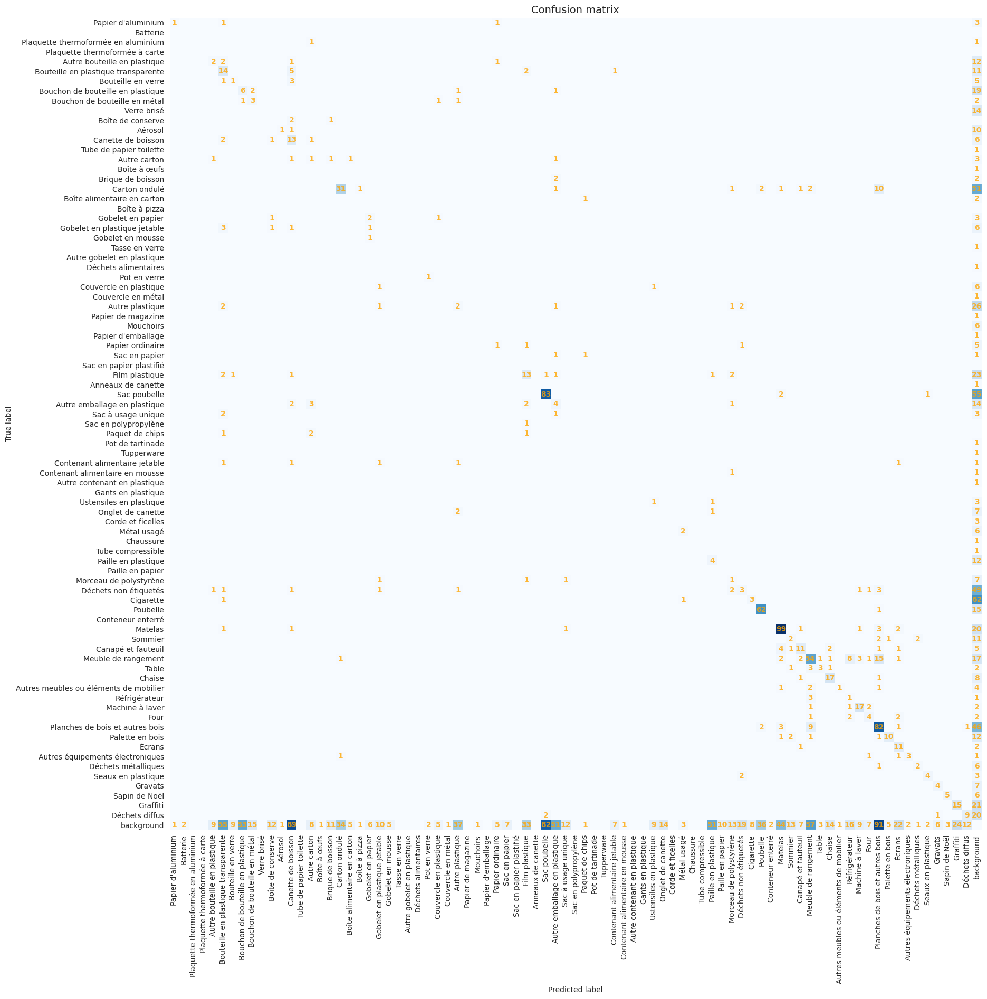

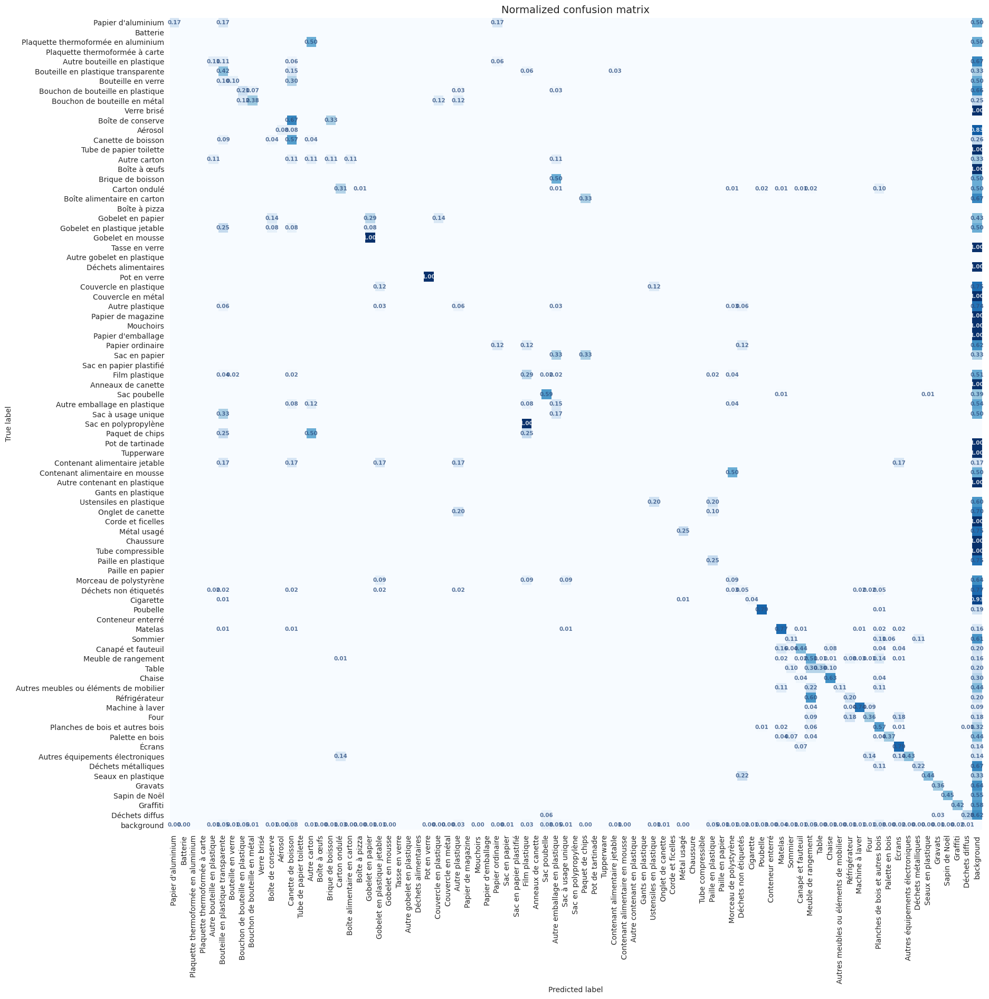

In [31]:
def normalize_confusion_matrix(matrix):
    """
    Normalise une matrice de confusion en divisant chaque élément
    par la somme de sa ligne respective.

    Args:
    matrix (numpy.ndarray): Matrice de confusion non normalisée.

    Returns:
    numpy.ndarray: Matrice de confusion normalisée.
    """
    # Calcul de la somme de chaque ligne
    row_sums = matrix.sum(axis=1)[:, np.newaxis]

    # Eviter la division par zéro
    row_sums[row_sums == 0] = 1

    # Normalisation
    normalized_matrix = matrix / row_sums

    return normalized_matrix


for normalize in [False, True]:

    if normalize:
        matrix = normalize_confusion_matrix(metrics.confusion_matrix.matrix.T)  # Utilisez votre fonction de normalisation ici
    else:
        matrix = metrics.confusion_matrix.matrix.T


    taille_fig = 20  # Vous pouvez ajuster cette valeur pour modifier la taille
    fig, ax = plt.subplots(figsize=(taille_fig, taille_fig))

    # Création et affichage de la matrice de confusion
    disp = ConfusionMatrixDisplay(confusion_matrix=matrix,
                                display_labels=list(CATIDX_2_FR_CATNAME.values()) + ["background"])


    title__ = "Normalized confusion matrix" if normalize else "Confusion matrix"

    disp.plot(ax=ax,include_values = False , colorbar=False, values_format=".2f" if normalize else None, cmap=plt.cm.Blues,xticks_rotation='vertical')


    for i in range(matrix.shape[0]):
        for j in range(matrix.shape[1]):
            value = matrix[i, j]
            if value > 0:
                color = "white" if value > 0.8 else "#2e5082"
                color = "orange" if not normalize else color
                ax.text(j, i, f'{value:.2f}' if normalize else f'{value:.3g}', ha="center", va="center", color=color,fontweight="bold", fontsize= 7.5 if normalize else 10, alpha= 0.8)

    ax.set_title(title__, fontsize=14)
    plt.grid(False)
    cm_path = f"{TRAINING_ROOT_LOGS_PATH}/{TRAINING_NAME_VAL_TEST}/cm ({title__}).png"
    print(cm_path)
    fig.savefig(cm_path, bbox_inches='tight',dpi=350)




##### Metrics per category

In [32]:
class_results_data = []
for i, cat_idx in enumerate(metrics.ap_class_index):#todo : il manque le nombre de truc avec le quel ça été evalué frr
    class_results_data.append([cat_idx] + list(metrics.box.class_result(i)))

df_class_results = pd.DataFrame(class_results_data, columns=["cat_idx", "P", "R", "mAP50", "mAP50-95"])
df_class_results["cat_name"] = df_class_results["cat_idx"].apply(lambda x: CATIDX_2_FR_CATNAME[x])
df_class_results["supercat_name"] = df_class_results["cat_idx"].apply(lambda x: CATIDX_2_FR_SUPERCATNAME[x])
# sort columns
df_class_results = df_class_results[
    ["cat_idx", "cat_name", "supercat_name", "P", "R", "mAP50", "mAP50-95"]]

df_class_results_path = f"{TRAINING_ROOT_LOGS_PATH}/{TRAINING_NAME_VAL_TEST}/df_class_results.csv"
df_class_results.to_csv(df_class_results_path, index=False, header=True)

df_class_results__ = df_class_results.style.background_gradient(axis=None, cmap='cool', vmin=0, vmax=0.5,
                                                                subset=["mAP50"])
dfi.export(df_class_results__, df_class_results_path.replace(".csv", ".png"),table_conversion="matplotlib", dpi=200)
df_class_results__

,cat_idx,cat_name,supercat_name,P,R,mAP50,mAP50-95
0,0,Papier d'aluminium,Papier d'aluminium,0.119752,0.166667,0.065403,0.058863
1,2,Plaquette thermoformée en aluminium,Plaquette thermoformée,0.000000,0.000000,0.000000,0.000000
2,4,Autre bouteille en plastique,Bouteille,0.205231,0.111111,0.168738,0.109662
3,5,Bouteille en plastique transparente,Bouteille,0.112037,0.393939,0.102783,0.083916
4,6,Bouteille en verre,Bouteille,0.000000,0.000000,0.014541,0.007271
5,7,Bouchon de bouteille en plastique,Bouchon de bouteille,0.106568,0.241379,0.085514,0.071009
6,8,Bouchon de bouteille en métal,Bouchon de bouteille,0.150890,0.375000,0.157137,0.145774
7,9,Verre brisé,Verre brisé,1.000000,0.000000,0.000000,0.000000
8,10,Boîte de conserve,Canette,0.000000,0.000000,0.000000,0.000000
9,11,Aérosol,Canette,0.440598,0.073433,0.270827,0.189579


In [33]:
# Paramètres de configuration
N = 15 # Nombre de classes à afficher pour les meilleurs et les pires

output_file = f"{TRAINING_ROOT_LOGS_PATH}/{TRAINING_NAME_VAL_TEST}/evaluation_results (cat_name).txt"  # Nom du fichier de sortie

with open(output_file, "w") as file:
    file.write(f">>> Evaluation sur {len(metrics.ap_class_index)} classes du test set {TEST_IMAGES_LONGNAME}\n")
    for sort_by in ["mAP50-95", "mAP50", "P", "R"]:
        # Meilleures classes
        best_classes_str = df_class_results.sort_values(by=sort_by, ascending=False).head(N)[["cat_idx", "cat_name","supercat_name", sort_by]].to_string(index=False)
        file.write(f"> Les {N} meilleures classes détectées par {sort_by}\n")
        file.write(best_classes_str + "\n\n")

        # Pires classes
        worst_classes_str = df_class_results.sort_values(by=sort_by, ascending=True).head(N)[["cat_idx", "cat_name","supercat_name", sort_by]].to_string(index=False)
        file.write(f"> Les {N} pires classes détectées par {sort_by}\n")
        file.write(worst_classes_str + "\n\n")
        file.write("-"*10 + "\n\n")



# Afficher le même contenu dans la console
with open(output_file, "r") as file:
    print(file.read())

>>> Evaluation sur 74 classes du test set fused-dataset 20240115 test images
> Les 15 meilleures classes détectées par mAP50-95
 cat_idx                               cat_name                 supercat_name  mAP50-95
      70                        Machine à laver       Appareil électroménager  0.748744
      62                                Matelas            Gros objet ménager  0.688877
      71                                   Four       Appareil électroménager  0.558197
      77                     Seaux en plastique        Conteneur en plastique  0.531691
      60                               Poubelle           Conteneur à déchets  0.515289
      64                     Canapé et fauteuil            Gros objet ménager  0.509765
      67                                 Chaise            Gros objet ménager  0.472239
      65                    Meuble de rangement            Gros objet ménager  0.462366
      26                           Pot en verre                  Pot en verre  0

In [34]:
df_class_results_by_super = df_class_results.groupby("supercat_name").agg({k: ["mean"] for k in ["mAP50-95", "mAP50", "P", "R"]})
df_class_results_by_super.columns = ["mean_mAP50-95", "mean_mAP50", "mean_P", "mean_R"]
df_class_results_by_super

df_class_results_by_super_path = f"{TRAINING_ROOT_LOGS_PATH}/{TRAINING_NAME_VAL_TEST}/df_class_results_by_super.csv"
df_class_results_by_super.to_csv(df_class_results_by_super_path, index=False, header=True)

df_class_results_by_super__ = df_class_results_by_super.style.background_gradient(axis=None, cmap='cool', vmin=0, vmax=0.5,
                                                                subset=["mean_mAP50"])
dfi.export(df_class_results_by_super__, df_class_results_by_super_path.replace(".csv", ".png"),table_conversion="matplotlib", dpi=200)
df_class_results_by_super__


,mean_mAP50-95,mean_mAP50,mean_P,mean_R
supercat_name,,,,
Appareil électroménager,0.467474,0.525064,0.411007,0.590514
Appareil électronique,0.437893,0.527831,0.454560,0.571429
Autre plastique,0.049695,0.063550,0.083925,0.114286
Bois,0.344796,0.435915,0.497812,0.385417
Bouchon de bouteille,0.108392,0.121325,0.128729,0.308190
Bouteille,0.066950,0.095354,0.105756,0.168350
Canette,0.090072,0.123643,0.176781,0.218832
Carton,0.053991,0.074993,0.122111,0.112575
Chaussure,0.000000,0.000000,0.000000,0.000000


In [35]:

# Paramètres de configuration
N = 5 # Nombre de classes à afficher pour les meilleurs et les pires

output_file = f"{TRAINING_ROOT_LOGS_PATH}/{TRAINING_NAME_VAL_TEST}/evaluation_results (cat_name).txt"  # Nom du fichier de sortie

with open(output_file, "w") as file:
    file.write(f">>> Evaluation sur {len(metrics.ap_class_index)} classes (et {len(df_class_results_by_super)} supercat) du test set {TEST_IMAGES_LONGNAME}\n")
    for sort_by in df_class_results_by_super.columns:
        # Meilleures classes
        best_classes_str = df_class_results_by_super.sort_values(by=sort_by, ascending=False).head(N)[[sort_by]].to_string()
        file.write(f"> Les {N} meilleures classes (supercat) détectées par {sort_by}\n")
        file.write(best_classes_str + "\n\n")

        # Pires classes
        worst_classes_str = df_class_results_by_super.sort_values(by=sort_by, ascending=True).head(N)[[sort_by]].to_string()
        file.write(f"> Les {N} pires classes (supercat) détectées par {sort_by}\n")
        file.write(worst_classes_str + "\n\n")
        file.write("-"*10 + "\n\n")



# Afficher le même contenu dans la console
with open(output_file, "r") as file:
    print(file.read())

>>> Evaluation sur 74 classes (et 35 supercat) du test set fused-dataset 20240115 test images
> Les 5 meilleures classes (supercat) détectées par mean_mAP50-95
                         mean_mAP50-95
supercat_name                         
Conteneur à déchets           0.515289
Appareil électroménager       0.467474
Pot en verre                  0.447750
Appareil électronique         0.437893
Gros objet ménager            0.384776

> Les 5 pires classes (supercat) détectées par mean_mAP50-95
                      mean_mAP50-95
supercat_name                      
Verre brisé                     0.0
Onglet de canette               0.0
Sac en papier                   0.0
Déchets alimentaires            0.0
Corde et ficelles               0.0

----------

> Les 5 meilleures classes (supercat) détectées par mean_mAP50
                         mean_mAP50
supercat_name                      
Conteneur à déchets        0.762341
Déchets saisonniers        0.599442
Appareil électronique      0.5278

#### !predict 🔥

Dans cette section, on va utiliser le modèle entraîné pour effectuer des prédictions sur des images. Les images sont chargées à partir d'un dossier et les prédictions (images avec les boîtes englobantes) sont enregistrées dans un dossier.

In [36]:
TRAINING_NAME_PREDICT_TEST = f"{TRAINING_NAME}/predict(test)"

TRAINING_ROOT_LOGS_PATH, TRAINING_NAME_PREDICT_TEST

('/content/gdrive/MyDrive/KESKIA Drive Mlamali/yolo-training-logs',
 'train yolov8s [fused-dataset 20240115, epochs=100] 20240121_1637/predict(test)')

In [37]:
results = best_model.predict(TEST_IMAGES_INPUT_DIR_PATH,
                             conf=CONFIDENCE_THRESHOLD,
                             imgsz=TRAINING_IMGSZ,
                             save=True, save_txt=True, save_conf=True,
                             name=TRAINING_NAME_PREDICT_TEST, project=TRAINING_ROOT_LOGS_PATH, stream=True)
results

<generator object BasePredictor.stream_inference at 0x7f52e97bf5a0>

In [38]:
# Liste pour stocker les données
pred_data = []

max_results = 300
# Afficher le lieu de sauvegarde des images
print(f"Les images avec les boîtes englobantes sont enregistrées dans: {TRAINING_NAME_PREDICT_TEST}")
# Parcourir les résultats de prédiction
for i, result in enumerate(results):
    path = result.path
    img_file = os.path.basename(path)
    if result.boxes is not None:
        for box in result.boxes:
            # Extraire les données de la boîte
            xywh = box.xywh.cpu().numpy().flatten()  # Aplatir le tableau
            x, y, w, h = xywh[0], xywh[1], xywh[2], xywh[3]

            cls = int(box.cls.cpu().numpy().item())
            conf = box.conf.cpu().numpy().item()

            # Ajouter les données à la liste
            pred_data.append([i, img_file, cls, x, y, w, h, conf])

    if max_results and i > max_results:
        break



Les images avec les boîtes englobantes sont enregistrées dans: train yolov8s [fused-dataset 20240115, epochs=100] 20240121_1637/predict(test)

image 1/774 /content/gdrive/MyDrive/KESKIA Drive Mlamali/datasets/processed/fused-dataset 20240115/test/images/103376969_1141501419555288_5732204628180766289_n_jpg.rf.6dc74dabdeffc43a5b68105924b8cae9.jpg: 640x640 1 Carton ondulé, 1 Poubelle, 1 Graffiti, 1 Déchets diffus, 1053.9ms
image 2/774 /content/gdrive/MyDrive/KESKIA Drive Mlamali/datasets/processed/fused-dataset 20240115/test/images/109746666_140979007652354_7385908406460374962_n_jpg.rf.b051b1c876be2eec4b6afc623f2db59c.jpg: 320x640 1 Poubelle, 1 Déchets diffus, 500.0ms
image 3/774 /content/gdrive/MyDrive/KESKIA Drive Mlamali/datasets/processed/fused-dataset 20240115/test/images/109994305_273791690581432_972719965232782571_n_jpg.rf.482b65427518972aeba696bebe0d647b.jpg: 640x480 3 Poubelles, 1 Déchets diffus, 755.0ms
image 4/774 /content/gdrive/MyDrive/KESKIA Drive Mlamali/datasets/processed/

##### Df predict results

Generate df predictions

In [39]:
# Créer un DataFrame pandas à partir des données collectées
df_predictions = pd.DataFrame(pred_data, columns=['i', 'img_file', 'cat_idx', 'x', 'y', 'w', 'h', 'conf'])
df_predictions["cat_name"] = df_predictions["cat_idx"].apply(lambda x: CATIDX_2_FR_CATNAME[x])

# Afficher le DataFrame
df_predictions

,i,img_file,cat_idx,x,y,w,h,conf,cat_name
0,0,103376969_1141501419555288_5732204628180766289...,60,46.768425,154.276123,93.394791,83.950943,0.780713,Poubelle
1,0,103376969_1141501419555288_5732204628180766289...,80,371.766907,63.500034,84.306000,126.243095,0.410290,Graffiti
2,0,103376969_1141501419555288_5732204628180766289...,81,216.929626,242.545410,393.495728,213.400223,0.378319,Déchets diffus
3,0,103376969_1141501419555288_5732204628180766289...,17,336.703369,220.281128,56.658112,42.062576,0.301272,Carton ondulé
4,1,109746666_140979007652354_7385908406460374962_...,60,36.908688,111.398468,73.667030,220.857025,0.792086,Poubelle
...,...,...,...,...,...,...,...,...,...
888,300,20982800_9018851_0023_jpg.rf.ce4e6f4db7e2431a2...,17,752.254517,367.063904,95.490906,85.607758,0.284941,Carton ondulé
889,300,20982800_9018851_0023_jpg.rf.ce4e6f4db7e2431a2...,65,349.823730,428.033905,265.740509,165.883484,0.220677,Meuble de rangement
890,301,20988629_9054193_0050_jpg.rf.0a66ffce8149df5e6...,72,517.260498,232.906876,409.744995,211.564545,0.605319,Planches de bois et autres bois
891,301,20988629_9054193_0050_jpg.rf.0a66ffce8149df5e6...,62,437.241364,428.492981,249.590393,178.061005,0.442626,Matelas


In [40]:
df_predictions_path = f"{TRAINING_ROOT_LOGS_PATH}/{TRAINING_NAME_PREDICT_TEST}/df_predictions (conf={CONFIDENCE_THRESHOLD}).csv"
df_predictions.to_csv(df_predictions_path, index=False, header=True)

##### Conf stats

<Axes: >

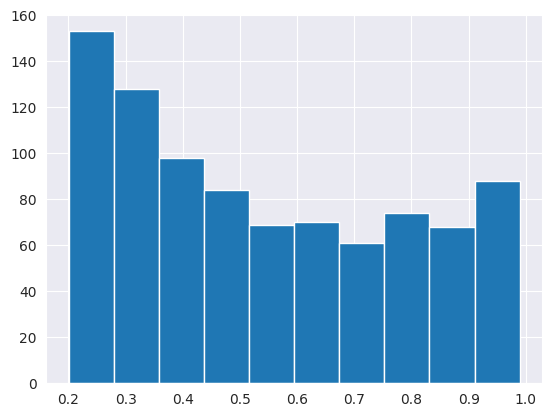

In [41]:
df_predictions["conf"].hist()

In [42]:
df_predictions["conf"].describe().T

count    893.000000
mean       0.540561
std        0.242278
min        0.200604
25%        0.318123
50%        0.499747
75%        0.761301
max        0.989236
Name: conf, dtype: float64

##### highest confidence
which classes are detected with the highest confidence

In [43]:
# group by class
df_predictions_by_cat = df_predictions.groupby(["cat_idx","cat_name"]).agg({"conf": ["mean", "count"]})
df_predictions_by_cat.columns = ["mean_conf", "count"]

# sort by mean confidence
df_predictions_by_cat.sort_index()
df_predictions_by_cat = df_predictions_by_cat.sort_values("mean_conf", ascending=False)
df_predictions_by_class_f_path = f"{TRAINING_ROOT_LOGS_PATH}/{TRAINING_NAME_PREDICT_TEST}/df_predictions_by_cat (conf={CONFIDENCE_THRESHOLD}).csv"
df_predictions_by_cat.to_csv(df_predictions_by_class_f_path, index=False, header=True)
df_predictions_by_cat

,,mean_conf,count
cat_idx,cat_name,,
70,Machine à laver,0.703026,35
62,Matelas,0.671882,128
74,Écrans,0.621958,37
73,Palette en bois,0.608590,19
66,Table,0.606260,4
79,Sapin de Noël,0.589043,2
64,Canapé et fauteuil,0.588299,21
67,Chaise,0.573787,30
34,Sac en papier,0.568539,3
